In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from dask.distributed import Client
import py3dep
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import math
import shapely
import matplotlib.pyplot as plt
import os
import xarray as xr
from datetime import datetime
import ulmo
from datetime import datetime
import sys
import contextily as ctx
import rioxarray as rxr
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib
import matplotlib.transforms as mtransforms
import logging
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils

In [2]:
#### CODE FOR DEVELOPMENT-- THIS RELOADS s1_rtc_bs_utils MODULE
sys.modules.pop('s1_rtc_bs_utils')
import s1_rtc_bs_utils

In [3]:
# GDAL environment variables for better performance
os.environ['AWS_REGION']='us-west-2'
os.environ['GDAL_DISABLE_READDIR_ON_OPEN']='EMPTY_DIR' 
os.environ['AWS_NO_SIGN_REQUEST']='YES' 
#
xr.set_options(keep_attrs=True)
# Paste /proxy/localhost:8787 for cluster diagnostics
client = Client(local_directory='/tmp', processes=False,silence_logs=logging.ERROR)
client

/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 40775 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://172.25.45.79:40775/status,
Dashboard: http://172.25.45.79:40775/status,Workers: 1
Total threads: 32,Total memory: 125.71 GiB
Status: running,Using processes: False
Comm: inproc://172.25.45.79/323072/1,Workers: 1
Dashboard: http://172.25.45.79:40775/status,Total threads: 32
Started: Just now,Total memory: 125.71 GiB
Comm: inproc://172.25.45.79/323072/4,Total threads: 32
Dashboard: http://172.25.45.79:36131/status,Memory: 125.71 GiB
Nanny: None,


In [4]:
# comment out
fontsize=19

font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : fontsize}

matplotlib.rc('font', **font)

In [5]:
rainier_bbox_gdf = gpd.read_file('../input/shapefiles/mt_rainier.geojson')
baker_bbox_gdf = gpd.read_file('../input/shapefiles/mt_baker.geojson')
helens_bbox_gdf = gpd.read_file('../input/shapefiles/mt_st_helens.geojson')
grandmesa_bbox_gdf = gpd.read_file('../input/shapefiles/grandmesa.geojson')

In [6]:
names = ['Mt. Rainier','Mt. Baker','Mt. St. Helens','Grand Mesa']
geojsons = ['../input/shapefiles/mt_rainier.geojson','../input/shapefiles/mt_baker.geojson','../input/shapefiles/mt_st_helens.geojson','../input/shapefiles/grandmesa.geojson']
collections=['../input/sentinel1-rtc-aws/mycollection_rainier.json','../input/sentinel1-rtc-aws/mycollection_baker.json','../input/sentinel1-rtc-aws/mycollection_rainier.json','../input/sentinel1-rtc-aws/mycollection_grandmesa.json']

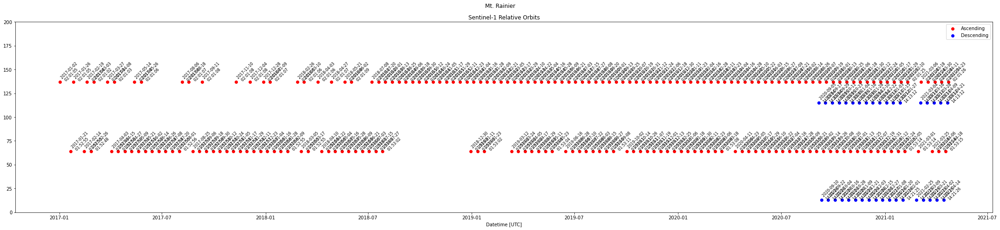

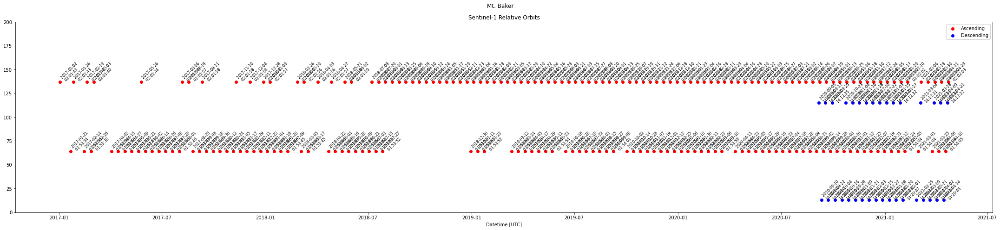

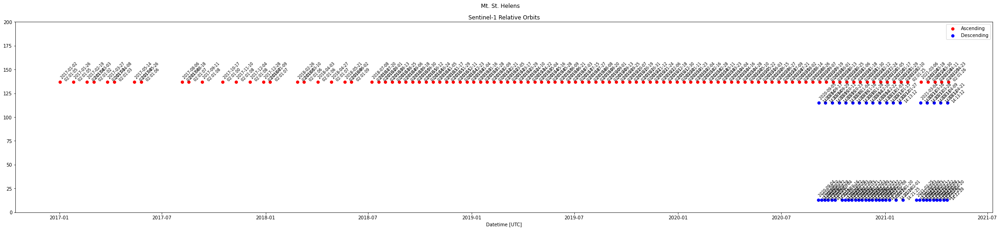

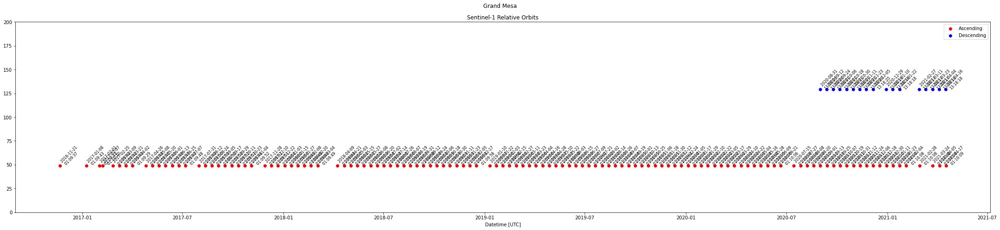

In [7]:
for nm, gj, colls in zip(names,geojsons,collections):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2015-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),orbit_direction='all',polarization='gamma0_vv',collection=colls)
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    f,ax=plt.subplots(figsize=(30,7))
    
    s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)
    f.suptitle(f'{nm}')
    plt.tight_layout()

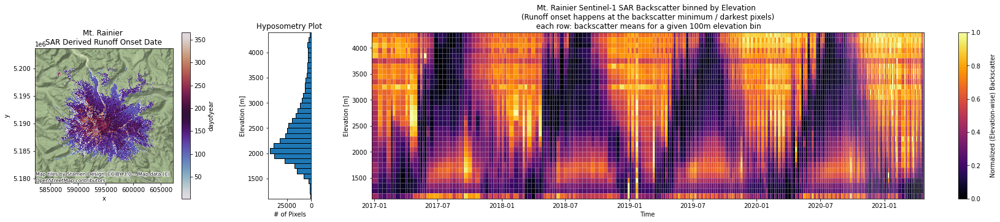

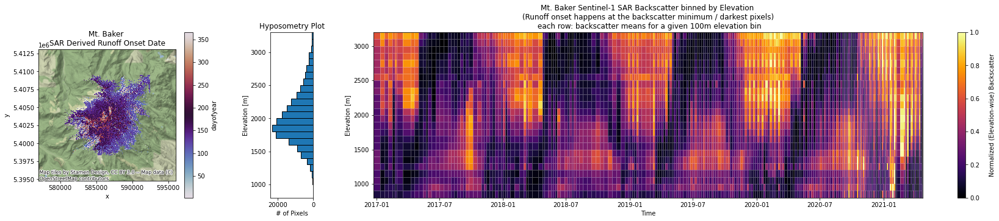

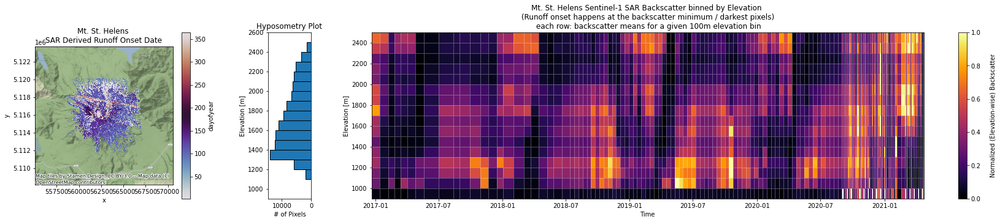

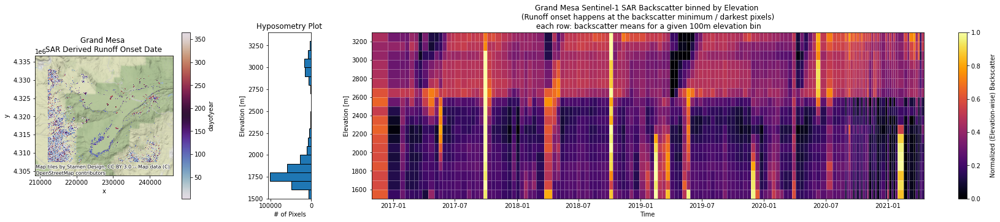

In [8]:
for nm, gj, colls in zip(names,geojsons,collections):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2015-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),orbit_direction='all',polarization='gamma0_vv',collection=colls)
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
    dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
    ts_ds = ts_ds.where(summer_ndvi_ds.values<0.2)
    dem = dem.where(summer_ndvi_ds.values<0.2)
    
    f,ax=plt.subplots(1,3,figsize=(30,5),gridspec_kw={'width_ratios': [4, 1, 16]})
    ax[1].invert_xaxis()
    s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax[2],normalize_bins=True) #normalize=False
    s1_rtc_bs_utils.plot_hyposometry(ts_ds,dem,bin_size=100,ax=ax[1])
    ax[2].set_title(f"{nm} Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin")
    minx, miny, maxx, maxy = ts_ds.rio.bounds()
    distance_cutoff=3
    #ts_ds.isel(time=0).plot(ax=ax[0],vmax=1.0,cmap='gray',add_colorbar=False)
    s1_rtc_bs_utils.get_runoff_onset(ts_ds).dt.dayofyear.plot(ax=ax[0],cmap='twilight')
    
    ax[0].set_xlim([minx-1000*distance_cutoff*1.2,maxx+1000*distance_cutoff*1.2])
    ax[0].set_ylim([miny-1000*distance_cutoff*1.2,maxy+1000*distance_cutoff*1.2])
    
    ctx.add_basemap(ax=ax[0], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain)
    ax[0].set_title(f'{nm} \nSAR Derived Runoff Onset Date')

In [9]:
# for nm, gj, colls in zip(names,geojsons,collections):
#     bbox_gdf = gpd.read_file(gj)
#     ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2015-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),orbit_direction='all',polarization='gamma0_vv',collection=colls)
#     ts_ds = ts_ds.compute()
#     ts_ds = ts_ds.dropna('time',how='all')
    
#     summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
#     dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
#     ts_ds = ts_ds.where(summer_ndvi_ds.values<0.2)
#     dem = dem.where(summer_ndvi_ds.values<0.2)
    
#     f,ax=plt.subplots(1,3,figsize=(30,5),gridspec_kw={'width_ratios': [4, 1, 16]})
#     ax[1].invert_xaxis()
#     s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax[2],normalize_bins=False) #normalize=False
#     s1_rtc_bs_utils.plot_hyposometry(ts_ds,dem,bin_size=100,ax=ax[1])
#     ax[2].set_title(f"{nm} Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin")
#     minx, miny, maxx, maxy = ts_ds.rio.bounds()
#     distance_cutoff=3
#     # ts_ds.isel(time=0).plot(ax=ax[0],vmax=1.0,cmap='gray',add_colorbar=False)
#     s1_rtc_bs_utils.get_runoff_onset(ts_ds).dt.dayofyear.plot(ax=ax[0],cmap='twilight')
    
#     ax[0].set_xlim([minx-1000*distance_cutoff*1.2,maxx+1000*distance_cutoff*1.2])
#     ax[0].set_ylim([miny-1000*distance_cutoff*1.2,maxy+1000*distance_cutoff*1.2])
    
#     ctx.add_basemap(ax=ax[0], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain)
#     ax[0].set_title(f'{nm} \nSAR Derived Runoff Onset Date')

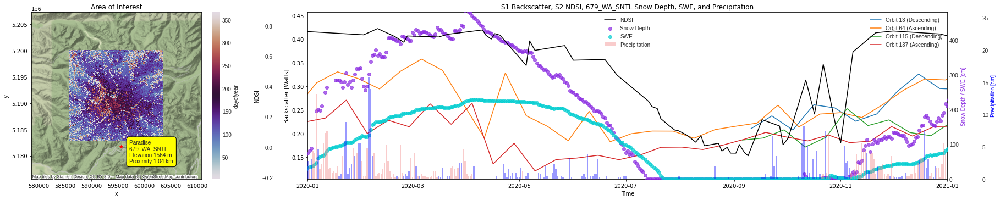

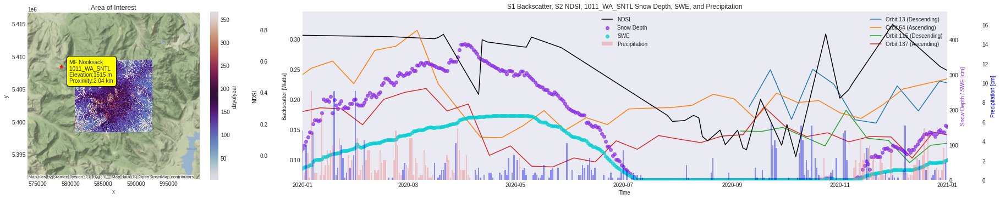

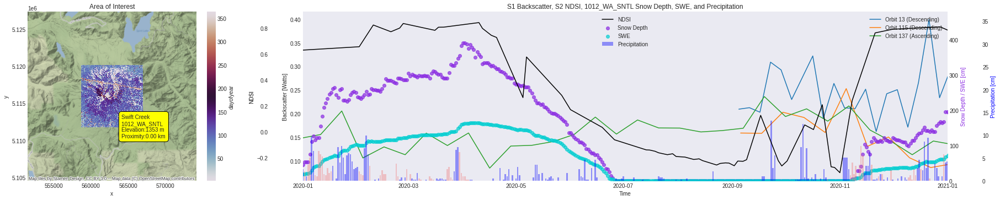

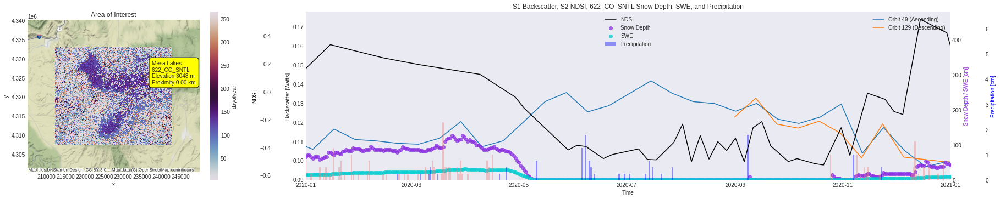

In [10]:
for nm, gj, colls in zip(names,geojsons,collections):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2015-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),orbit_direction='all',polarization='gamma0_vv',collection=colls)
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    s1_rtc_bs_utils.plot_bs_ndsi_swe_precip_with_context(ts_ds,start_date='2020-01-01',end_date='2021-01-01')

In [11]:
# for nm, gj, colls in zip(names,geojsons,collections):
#     bbox_gdf = gpd.read_file(gj)
#     ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2019-01-01',end_time='2020-01-01',orbit_direction='all',polarization='gamma0_vv',collection=colls)
#     ts_ds = ts_ds.compute()
#     ts_ds = ts_ds.dropna('time',how='all')
    
#     summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
#     dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
#     ts_ds = ts_ds.where(summer_ndvi_ds.values<0.2)
#     dem = dem.where(summer_ndvi_ds.values<0.2)
    
#     f,ax=plt.subplots(1,3,figsize=(30,5),gridspec_kw={'width_ratios': [4, 1, 16]})
#     ax[1].invert_xaxis()
#     s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax[2],normalize_bins=True) #normalize=False
#     s1_rtc_bs_utils.plot_hyposometry(ts_ds,dem,bin_size=100,ax=ax[1])
#     ax[2].set_title(f"{nm} Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin")
#     minx, miny, maxx, maxy = ts_ds.rio.bounds()
#     distance_cutoff=3
    
#     #ts_ds.isel(time=0).plot(ax=ax[0],vmax=1.0,cmap='gray',add_colorbar=False)
#     s1_rtc_bs_utils.get_runoff_onset(ts_ds).dt.dayofyear.plot(ax=ax[0],cmap='twilight')
    
#     ax[0].set_xlim([minx-1000*distance_cutoff*1.2,maxx+1000*distance_cutoff*1.2])
#     ax[0].set_ylim([miny-1000*distance_cutoff*1.2,maxy+1000*distance_cutoff*1.2])
    
#     ctx.add_basemap(ax=ax[0], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain)
#     ax[0].set_title(f'{nm} \nSAR Derived Runoff Onset Date')

In [12]:
# for nm, gj, colls in zip(names,geojsons,collections):
#     bbox_gdf = gpd.read_file(gj)
#     ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2020-01-01',end_time='2021-01-01',orbit_direction='all',polarization='gamma0_vv',collection=colls)
#     ts_ds = ts_ds.compute()
#     ts_ds = ts_ds.dropna('time',how='all')
    
#     summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
#     dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
#     ts_ds = ts_ds.where(summer_ndvi_ds.values<0.2)#.resample(time='2W').mean(dim='time')
#     dem = dem.where(summer_ndvi_ds.values<0.2)
    
#     f,ax=plt.subplots(1,3,figsize=(30,5),gridspec_kw={'width_ratios': [4, 1, 16]})
#     ax[1].invert_xaxis()
#     s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax[2],normalize_bins=False) #normalize=False
#     s1_rtc_bs_utils.plot_hyposometry(ts_ds,dem,bin_size=100,ax=ax[1])
#     ax[2].set_title(f"{nm} Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin")
#     minx, miny, maxx, maxy = ts_ds.rio.bounds()
#     distance_cutoff=3
    
#     #ts_ds.isel(time=0).plot(ax=ax[0],vmax=1.0,cmap='gray',add_colorbar=False)
#     s1_rtc_bs_utils.get_runoff_onset(ts_ds).dt.dayofyear.plot(ax=ax[0],cmap='twilight')
    
#     ax[0].set_xlim([minx-1000*distance_cutoff*1.2,maxx+1000*distance_cutoff*1.2])
#     ax[0].set_ylim([miny-1000*distance_cutoff*1.2,maxy+1000*distance_cutoff*1.2])
    
#     ctx.add_basemap(ax=ax[0], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain)
#     ax[0].set_title(f'{nm} \nSAR Derived Runoff Onset Date')

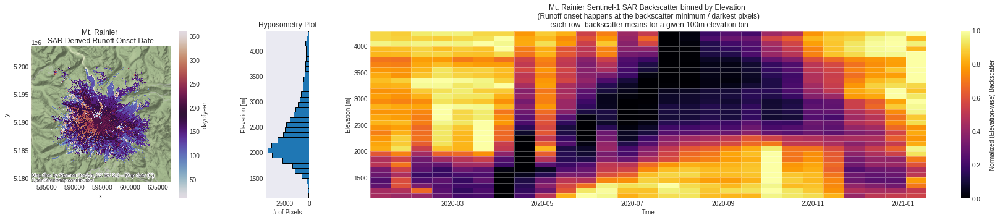

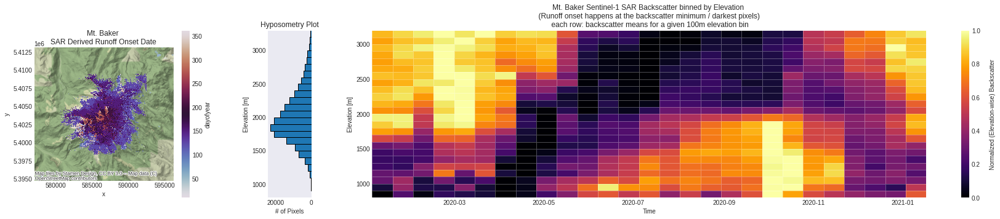

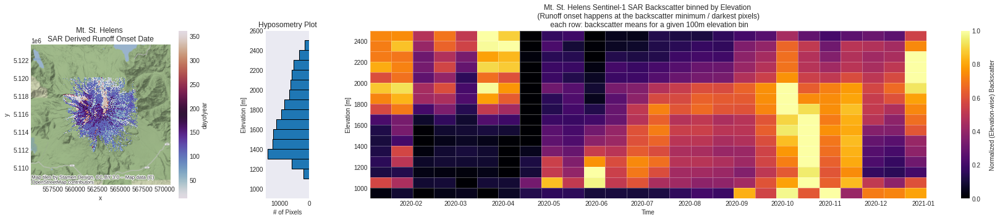

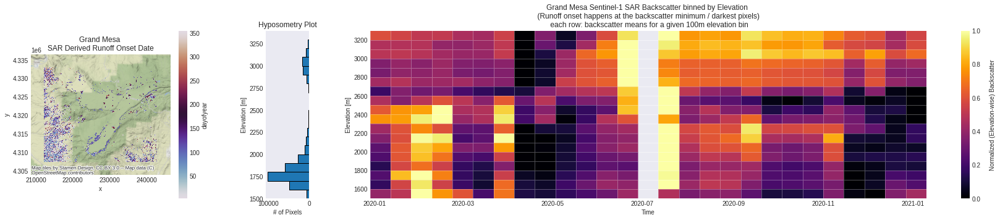

In [13]:
for nm, gj, colls in zip(names,geojsons,collections):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2020-01-01',end_time='2021-01-01',orbit_direction='all',polarization='gamma0_vv',collection=colls)
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
    dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
    ts_ds = ts_ds.where(summer_ndvi_ds.values<0.2).resample(time='2W').mean(dim='time')
    dem = dem.where(summer_ndvi_ds.values<0.2)
    
    f,ax=plt.subplots(1,3,figsize=(30,5),gridspec_kw={'width_ratios': [4, 1, 16]})
    ax[1].invert_xaxis()
    s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax[2],normalize_bins=True) #normalize=False
    s1_rtc_bs_utils.plot_hyposometry(ts_ds,dem,bin_size=100,ax=ax[1])
    ax[2].set_title(f"{nm} Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin")
    minx, miny, maxx, maxy = ts_ds.rio.bounds()
    distance_cutoff=3
    
    #ts_ds.isel(time=0).plot(ax=ax[0],vmax=1.0,cmap='gray',add_colorbar=False)
    s1_rtc_bs_utils.get_runoff_onset(ts_ds).dt.dayofyear.plot(ax=ax[0],cmap='twilight')
    
    ax[0].set_xlim([minx-1000*distance_cutoff*1.2,maxx+1000*distance_cutoff*1.2])
    ax[0].set_ylim([miny-1000*distance_cutoff*1.2,maxy+1000*distance_cutoff*1.2])
    
    ctx.add_basemap(ax=ax[0], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain)
    ax[0].set_title(f'{nm} \nSAR Derived Runoff Onset Date')

In [14]:
fontsize=19

font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : fontsize}

matplotlib.rc('font', **font)

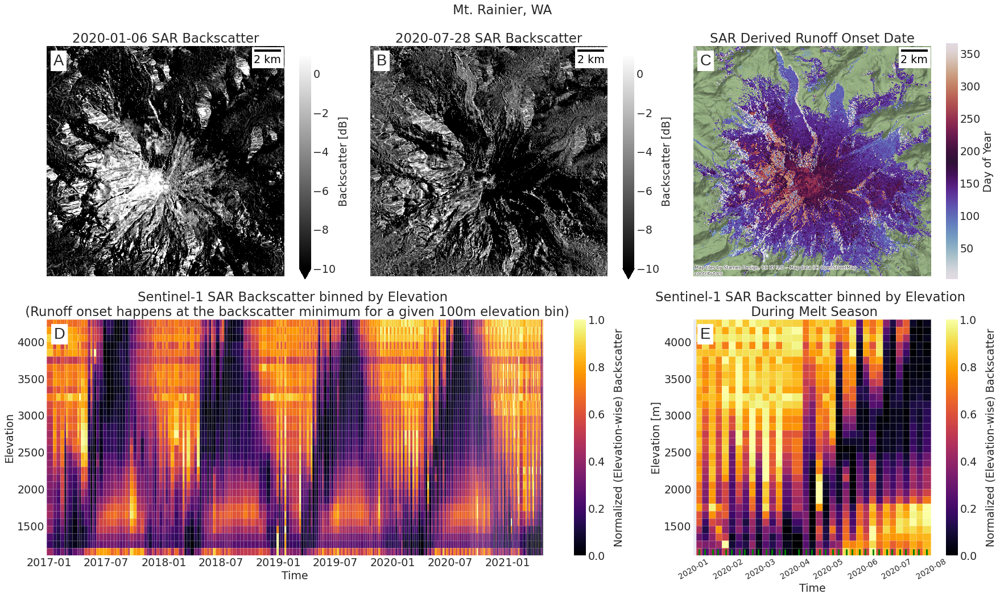

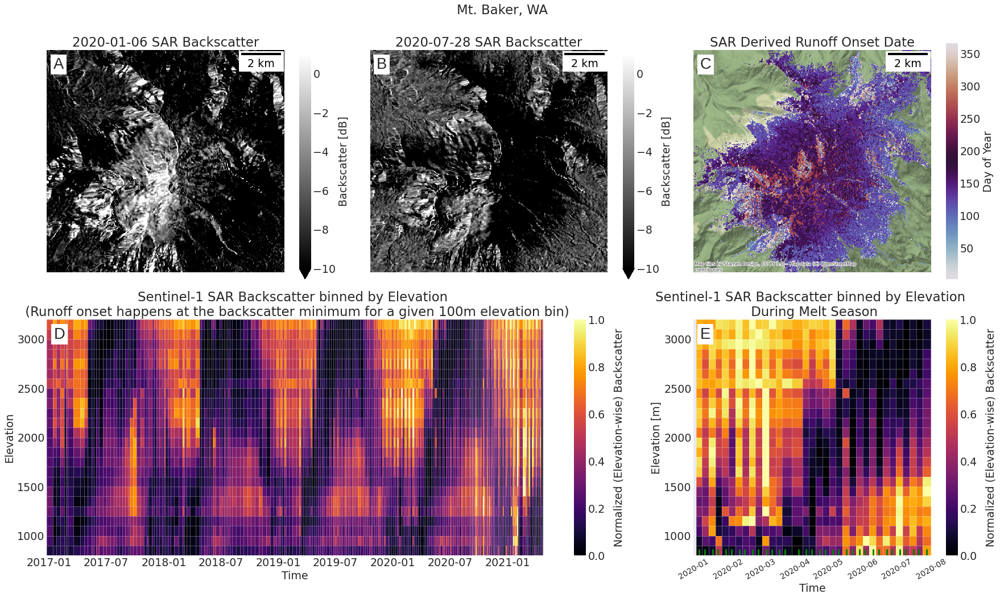

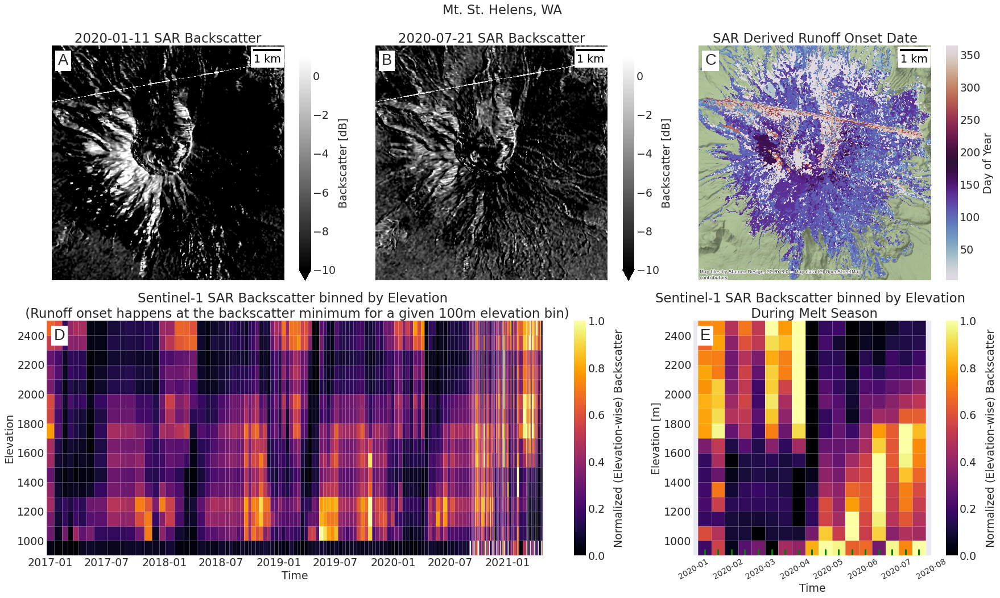

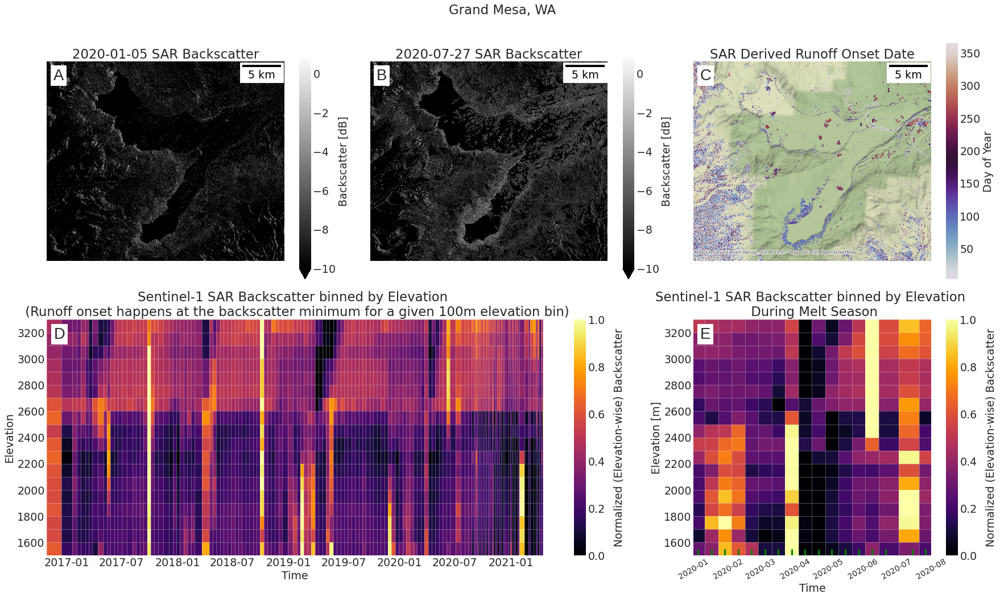

In [15]:
start_clip = '2020-01-01'
end_clip = '2020-08-01'

for nm, gj, colls in zip(names,geojsons,collections):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time='2015-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),orbit_direction='all',polarization='gamma0_vv',collection=colls)
    ts_ds = ts_ds.compute()
    ts_ds = ts_ds.dropna('time',how='all')
    
    summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
    dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)
    
    ts_ds = ts_ds.where(summer_ndvi_ds.values<0.2)#.resample(time='2W').mean(dim='time')
    dem = dem.where(summer_ndvi_ds.values<0.2)
    
    f,ax=plt.subplot_mosaic("ABC;DDE",figsize=(25,15))

    s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax['D'],normalize_bins=True) #normalize=False
    ax['D'].set_title(f"Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum for a given 100m elevation bin)")
    
    ax['D'].set_xlabel('Time')
    ax['D'].set_ylabel('Elevation')
    
    ax['E'].set_xlabel('Time')
    ax['E'].set_ylabel('Elevation')
    
    ts_ds_clipped = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time=start_clip,end_time=end_clip,orbit_direction='all',polarization='gamma0_vv',collection=colls)
    ts_ds_clipped = ts_ds_clipped.compute()
    ts_ds_clipped = ts_ds_clipped.dropna('time',how='all')
    
    aq_dates = list(pd.to_datetime(ts_ds_clipped.time.values).strftime('%Y-%m-%d'))
    
    s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds_clipped,dem,bin_size=100,ax=ax['E'],normalize_bins=True) #normalize=False
    ax['E'].set_title(f"Sentinel-1 SAR Backscatter binned by Elevation \n During Melt Season")
    
    (10*np.log10(ts_ds_clipped.isel(time=0))).plot(ax=ax['A'],vmin=-10,vmax=1,cmap='gray',cbar_kwargs={'label': 'Backscatter [dB]'})
    (10*np.log10(ts_ds_clipped.isel(time=-1))).plot(ax=ax['B'],vmin=-10,vmax=1,cmap='gray',cbar_kwargs={'label': 'Backscatter [dB]'})
    
    time1 = pd.to_datetime(ts_ds_clipped.isel(time=0).time.values).strftime('%Y-%m-%d')
    time2 = pd.to_datetime(ts_ds_clipped.isel(time=-1).time.values).strftime('%Y-%m-%d')
     
    ax['A'].set_title(f'{time1} SAR Backscatter')
    ax['B'].set_title(f'{time2} SAR Backscatter')
    
    ax['A'].axis('off')
    ax['A'].add_artist(ScaleBar(1.0))
    ax['A'].set_aspect('equal')
    ax['B'].axis('off')
    ax['B'].add_artist(ScaleBar(1.0))
    ax['B'].set_aspect('equal')
    ax['C'].axis('off')
    ax['C'].add_artist(ScaleBar(1.0))
    ax['C'].set_aspect('equal')

    #ax['D'].tick_params(axis='both', which='major')
    ax['E'].tick_params(axis='x', which='major', labelsize=fontsize-5)

    #ax['E'].set_xticks(aq_dates)
    
    #ax['E'].xaxis.set_minor_locator(FixedLocator(aq_dates))
    #ax['E'].tick_params(axis='x', colors='green')
    
    for date in aq_dates:
        ax['E'].axvline(x=date, ymax=0.025, linewidth=3, color='green')
    
    ax['E'].set_xlim([start_clip,end_clip])
    #[t.set_color('green') for t in ax['E'].xaxis.get_ticklines()]
    #ax['E'].set_xticklabels(ax['E'].get_xticks(), rotation = 30)
    [t.set_rotation(30) for t in ax['E'].get_xticklabels()]
    
    #ts_ds.isel(time=0).plot(ax=ax[0],vmax=1.0,cmap='gray',add_colorbar=False)
    s1_rtc_bs_utils.get_runoff_onset(ts_ds).dt.dayofyear.plot(ax=ax['C'],cmap='twilight',cbar_kwargs={'label': 'Day of Year'})
    ctx.add_basemap(ax=ax['C'], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain)
    ax['C'].set_title(f'SAR Derived Runoff Onset Date')
    
    distance_cutoff=1
    minx, miny, maxx, maxy = ts_ds.rio.bounds()
    ax['C'].set_xlim([minx,maxx])
    ax['C'].set_ylim([miny,maxy])
    
    for label, axs in ax.items():
        # label physical distance in and down:
        trans = mtransforms.ScaledTranslation(10/72, -5/72, f.dpi_scale_trans)
        axs.text(0.003, 0.98, label, transform=axs.transAxes + trans,
            fontsize='x-large', verticalalignment='top', fontfamily='sans-serif',
            bbox=dict(facecolor='white', edgecolor='none', pad=5.0))
    
    f.suptitle(f'{nm}, WA \n')
    
    plt.tight_layout()
    
    
    plt.savefig(f'../output/westernUS/combined_snowmelt_{nm}.png',dpi=150)
    

In [16]:
# now do elevation-meltday curve for each year and each mountain